In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix

%matplotlib inline

In [7]:
df = pd.read_csv("conversion_data_train.csv")
df.head()

,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0


# PART 1

## EDA

In [3]:
print("Number of Obsevations:", df.shape[0])
print("Number of conversion:", df['converted'].sum())
print("General conversion rate: %" ,round(df['converted'].sum() / df.shape[0] * 100,2))

Number of Obsevations: 284580
Number of conversion: 9180
General conversion rate: % 3.23


In [4]:
df.describe()

,age,new_user,total_pages_visited,converted
count,284580.000000,284580.000000,284580.000000,284580.000000
mean,30.564203,0.685452,4.873252,0.032258
std,8.266789,0.464336,3.341995,0.176685
min,17.000000,0.000000,1.000000,0.000000
25%,24.000000,0.000000,2.000000,0.000000
50%,30.000000,1.000000,4.000000,0.000000
75%,36.000000,1.000000,7.000000,0.000000
max,123.000000,1.000000,29.000000,1.000000


- Looking at the descriptive statistics, the average age of users is almost 31 but the age variable have some unrealistic outlier values like 123, so we should keep this in mind while cleaning data.
- 69% of the users in the dataset are new users and average number of pages visited by users are 4.87.


In [5]:
sns.set_theme()

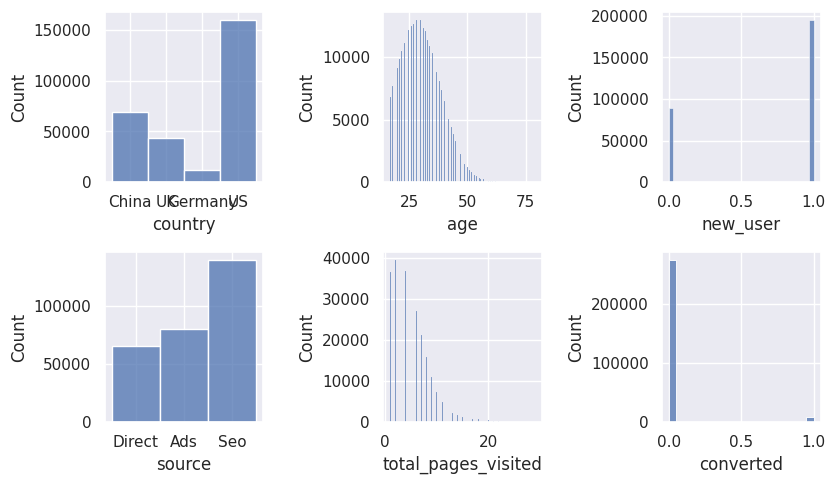

In [6]:
fig, axes = plt.subplots(2, 3, figsize=(8.5, 5))  # Creating subplots with 1 row and 2 columns
axes = axes.flatten()

for i, column in enumerate(df.columns):
    sns.histplot(x=column, data=df[df['age']<100], ax=axes[i], stat="count")  # Using sns.histplot instead of sns.displot

# Adjust layout
plt.tight_layout()
plt.show()

We could get some further insights from the histograms above:
- An overwhelming majority of users in the dataset are from the US, which is followed by China and UK, with Germany having the smallest share of users in our data.
- Notice that I already filtered the age variable by omitting any value over 100 while specifying the dataframe for the graphs, this way we could better see its distribution. Far from a Gaussian distribution, users' age mostly concentrates between 20 and 40.
- Regarding the source, SEO is the most common one, followed by the Ads, and finally direct sources.
- The number of pages visited also displays a skewed distribution pattern with very few users visiting more than 20 pages.
- Finally, the classes for our target variable (converted or not) are so imbalanced that we should keep this in mind while testing model performances because accuracy wouldn't probably be an appropriate metric for this dataset.

#### Now let's look at how these variables correlate with the target variable.

In [8]:
df['converted'] = df['converted'].astype(str)
fig = px.scatter(df[df['age'] < 100], #filtered out the observation with extreme values of age
                 x="total_pages_visited", y="age",
                color="converted", hover_name="converted", facet_col = 'country', facet_row = 'source')
fig.show()

The graph gives us insight on the distribution of the conversion decision both across categorical variables (source and country) and numerical variables (age and number of pages visited in total).
- Age does not seem to affect the decision to convert in a linear pattern, yet we can say that users above 60 (who don't actually compose a large portion of the sample) are much less likely to convert.
- Total number of pages visited shows some positive correlation with the decision to convert.
- Interestingly, there is a relationship between the number of pages visited and age. Older people rarely visits more than 15 pages in all countries. Also Chinese people visit in average less pages than the users from other countries.
- The country seem to be a very good predictor of the conversion decision with Chinese people having a very low conversion rate than others.

Let's also check the interaction of categorical variables with conversion rate in a different plot:

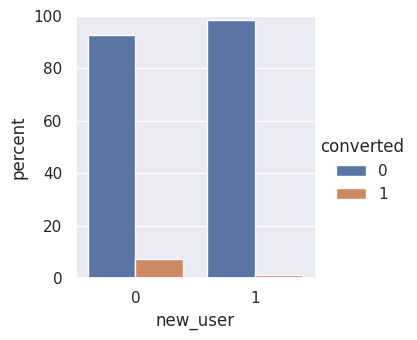

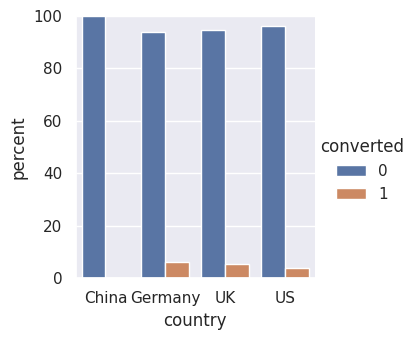

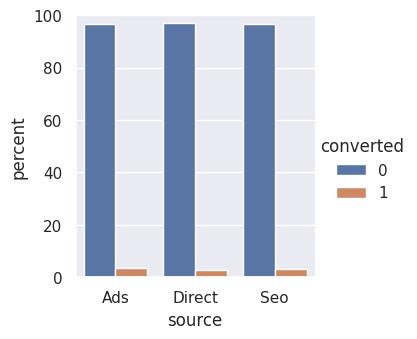

In [8]:
for col in ['new_user','country', 'source']:
  df_n = df.groupby(col)['converted'].value_counts(normalize=True)
  df_n = df_n * 100
  df_n = df_n.rename('percent').reset_index()
  g = sns.catplot(x=col,y='percent',hue='converted',kind='bar',data=df_n, height = 3.5 )
  g.ax.set_ylim(0,100)


The graph above indicate that though rate of conversion is low for all values of the categorical variables, it's not distributed evenly.
- The new users have an even lower conversion rate than non-new users.
- Chinese users have a near zero conversion rate while German users have the highest turnout in our dataset.
- As suggested also in the scatterplot, the source does not seem to be a determinant factor in conversion.


Now let's transform the variable'converted' back to integer in order not to cause any mismatch between the training and the test dataset (the one without labels)

In [9]:
df['converted']= df['converted'].astype(int)

In [10]:
print("Percentage of missing values: % ")
display(100*df.isnull().sum()/df.shape[0])

Percentage of missing values: % 


country                0.0
age                    0.0
new_user               0.0
source                 0.0
total_pages_visited    0.0
converted              0.0
dtype: float64

In [62]:
features_list = ['country', 'age', 'new_user', 'source', 'total_pages_visited']
target = 'converted'
cat_features = ['country', 'source', 'new_user']
num_features = ['age', 'total_pages_visited']

## Data Preprocessing

- Categorical variables : source, country, new_user (the. last one is already encoded)
- Numerical variables : age, total_pages_visited
- we don't have any missing data, so we don't need any imputation. I will only clean the extreme age values over 100.

In [63]:
df = df[df['age'] < 100]

In [64]:
num_transformer = Pipeline([('scaler', StandardScaler())])
cat_transformer = Pipeline([('encoder', OneHotEncoder(drop='first'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_transformer, num_features),
        ('cat', cat_transformer, cat_features)
    ])

Although it's a common practice drop one of the one-hot encoded dummies to avoid multicolinearity in linear models, in fact there is no such need in tree and ensemble models. Therefore, I will create an extra column transformer that keep all columns for categorical variables to use later on with such models.

In [14]:
cat_transformer_full = Pipeline([('encoder', OneHotEncoder())])

full_preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_transformer, num_features),
        ('cat', cat_transformer_full, cat_features)
    ])

## Baseline Model

Even though I already designed preprocesser that transform all columns, at this step I will be first generating a baseline model with one variable: total_pages_visited

In [65]:
X_train, X_test,Y_train, Y_test = train_test_split(df[features_list], df[target], test_size= 0.25, random_state = 42)
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

X_train.shape


(213433, 8)

X_train seems to have 8 features after applying column transformations. Let's get the column names out in order to find the column for total_pages_visited

In [16]:
column_names = []
for name, transformer, features in preprocessor.transformers_: # loop over pipelines
    if name == 'num':
        features = features
    elif name == 'cat': # if pipeline is for categorical variables
        features = transformer.named_steps['encoder'].get_feature_names_out() # get output columns names from OneHotEncoder
    column_names.extend(features)
column_names

['age',
 'total_pages_visited',
 'country_Germany',
 'country_UK',
 'country_US',
 'source_Direct',
 'source_Seo',
 'new_user_1']

The number of pages visited is located in the column with the index 1, let's retrieve it and turn it into a 1-d array to be able to pass it through the scikit-learn's Logistic Regression model.

In [17]:
pages_train = X_train[:,1].reshape(-1,1)
pages_test = X_test[:,1].reshape(-1,1)

In [18]:
model = LogisticRegression()
model.fit(pages_train, Y_train)

print("train accuracy:", model.score(pages_train, Y_train))
print("test accuracy:", model.score(pages_test, Y_test))

Ptrain = model.predict(pages_train)
Ptest = model.predict(pages_test)
print("train F1:", f1_score(Y_train, Ptrain))
print("test F1:", f1_score(Y_test, Ptest))

train score: 0.9831516213518997
test score: 0.9823880806803008
train F1: 0.6972044459413944
test F1: 0.6890047158103748


The baseline model with single variable displays over 98% accuracy both for the train and test sets. However, as mentioned earlier, accuracy is not a good metric in highly imbalanced dataset because in such datasets a model that is only predicting the dominant class can also achieve high accuracy scores but this doesn't make it a good model as it will be completely biased towards the dominant class.

Instead, a good evaluation strategy is to look at f1-score which searches a balance between precision and recall, in other words, false positives and false negatives.

The F1 score of our baseline model is 0.70 for the train set and 0.69 for the test set. Let's try to improve this model.

# PART 2: IMPROVING THE MODEL

### Training a model with all variables

In [19]:
#X_train, X_test,Y_train, Y_test = train_test_split(df[features_list], df[target], test_size= 0.25, random_state = 42)
#X_train = preprocessor.fit_transform(X_train)
#X_test = preprocessor.transform(X_test)
LR = LogisticRegression()
LR.fit(X_train, Y_train)

LogisticRegression()

In [ ]:
print("train accuracy:", LR.score(X_train, Y_train))
print("test accuracy:", LR.score(X_test, Y_test))

Ptrain = LR.predict(X_train)
Ptest = LR.predict(X_test)
print("train F1:", f1_score(Y_train, Ptrain))
print("test F1:", f1_score(Y_test, Ptest))

train score: 0.9863376328871355
test score: 0.9859020310633214
train F1: 0.763119415109667
test F1: 0.7618142958917122


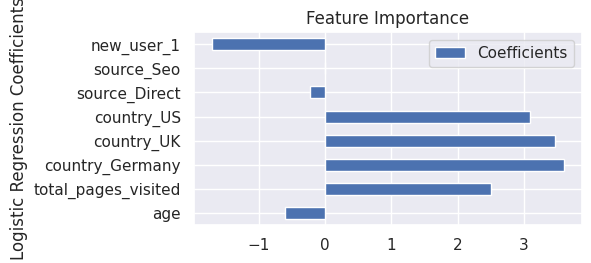

In [25]:
coefs = pd.DataFrame(
   LR.coef_.ravel(),
   columns=['Coefficients'], index=column_names)

coefs.plot(kind='barh', figsize=(5, 2.5))

plt.ylabel('Logistic Regression Coefficients')
plt.title('Feature Importance')
plt.show()

- Here we can see that variable with the largest coefficient is country. The coefficients for the dummies for Germany, UK and US are high and positive. This chart mathematically illustrates what we already explored in EDA: being from the base country (China) is highly negatively correlated with the conversion rate.
- The number of pages visited is the next most important variable, and positively correlated with conversion decision.
- Being a new user has the next largest coefficient in terms of magnitude and it is negatively correlated with the conversion as we previously observed.
- Again, as we observed in the EDA stage, the source variable has a very negligible impact. Both Direct source dummy and SEO dummy have a near-zero coefficient, which suggests that these categories do not correspond to a major change in the decision to convert compared to the base category (Ads source).

Our Logistic Regression Model with default hyperparameters achieved a f1 score near 0.76 for both trainset and testset. In the next section, I will be exploring some other classifiers.

### Naive Bayes Classifier

In [26]:
NB = GaussianNB()
NB.fit(X_train, Y_train)


GaussianNB()

In [27]:
print("train score:", NB.score(X_train, Y_train))
print("test score:", NB.score(X_test, Y_test))

Ptrain = NB.predict(X_train)
Ptest = NB.predict(X_test)
print("train F1:", f1_score(Y_train, Ptrain))
print("test F1:", f1_score(Y_test, Ptest))

train score: 0.9788879882679811
test score: 0.9790709115187294
train F1: 0.6974214343271555
test F1: 0.7059055895714003


The Naive-Bayes classifier performed much more poorly than Logistic Regression both in terms of accuracy and in terms of F1 score.

### K-Nearest Neighbors Classifier

In [30]:
KNN = KNeighborsClassifier(n_neighbors = 100)
KNN.fit(X_train, Y_train)

KNeighborsClassifier(n_neighbors=100)

In [31]:
print("train accuracy:", KNN.score(X_train, Y_train))
print("test accuracy:", KNN.score(X_test, Y_test))

Ptrain = KNN.predict(X_train)
Ptest = KNN.predict(X_test)
print("train F1:", f1_score(Y_train, Ptrain))
print("test F1:", f1_score(Y_test, Ptest))

train accuracy: 0.9860799407776679
test accuracy: 0.9853819664066343
train F1: 0.7514431523466912
test F1: 0.7452229299363057


### Decision Tree

#### Preprocessing without "Drop First":

In fact, while there are discussions even on the usefulness for "drop=first" for linear models in ML, (as this approach is rather coming from statistics and more about the [meaningfulness of coefficients ](https://towardsdatascience.com/drop-first-can-hurt-your-ols-regression-models-interpretability-4ca529cfb707#:~:text=Python%20libraries%20such%20as%20Pandas,alpha%2Dnumerically%20in%20the%20set.)rather than model's predictive power), there is an even [broader debate ](https://kiwidamien.github.io/are-you-getting-burned-by-one-hot-encoding.html)on the need for one-hot encoding for tree models altogether.

In the following section, I chose to apply one-hot encoding for categorical variables but without dropping the first category as tree models do not work with coefficients anyway. Indeed, the models with full_preprocessor (the one which one-hot encodes and keeps all dummies) performed better than the models with standard preprocessor.

In [32]:
X_train, X_test,Y_train, Y_test = train_test_split(df[features_list],
                                                   df[target].astype(int), test_size= 0.25, random_state = 42)
X_train = full_preprocessor.fit_transform(X_train)
X_test = full_preprocessor.transform(X_test)


DT = DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2,
                       min_samples_split=25, splitter='random', random_state = 42)
DT.fit(X_train, Y_train)


DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2,
                       min_samples_split=25, random_state=42,
                       splitter='random')

In [33]:
print("train accuracy:", DT.score(X_train, Y_train))
print("test accuracy:", DT.score(X_test, Y_test))

Ptrain = DT.predict(X_train)
Ptest = DT.predict(X_test)
print("train F1:", f1_score(Y_train, Ptrain))
print("test F1:", f1_score(Y_test, Ptest))

train accuracy: 0.9861314791995615
test accuracy: 0.9857333614449364
train F1: 0.7607887506061096
test F1: 0.7604437101722917


### Random Forest Classifier

In [37]:
RF = RandomForestClassifier(n_estimators = 200, max_depth=7, min_samples_leaf= 5,
 min_samples_split =12,random_state=42,n_jobs= -1)
RF.fit(X_train, Y_train)


P_test = RF.predict(X_test)
P_train = RF.predict(X_train)
print("train F1:", f1_score(Y_train, P_train))
print("test F1:", f1_score(Y_test, P_test))


train F1: 0.7600559348523486
test F1: 0.7580217129071172


## Model Selection based on performance

Below, I will compare the performances of these 5 classifiers by evaluating them on different test setç
I applied to 2 strategies to augment the randomness of the sampling:
- 1. I will perform 5 different random train/test splits, train the models from scratch over 5 different training set and evaluate their performances on the test set.
- 2. For each model, I will use 5-fold cross validation when assessing their f1-score metric on the test sets. Therefore, I will calculate in total 25 f1-scores for each of these classifiers.

In [38]:
models = {LR : 'Logistic Regression',
          NB : 'Naive Bayes',
          KNN : 'K-Nearest Neighbors',
          DT : 'Decision Tree',
          RF : 'Random Forest'}

tree_models = ['DT','RF']
eval_model = {}
for model in models.keys():
  if models[model] not in eval_model:
    eval_model[models[model]] = []

  for i in range(5): #looping over 5 different splits so that we will shuffle the train-test sets
    X_train, X_test,Y_train, Y_test = train_test_split(df[features_list],
                                                   df[target].astype(int), test_size= 0.25)
    if model in tree_models :
        X_train = full_preprocessor.fit_transform(X_train)
        X_test = full_preprocessor.transform(X_test)

        #applying 5-fold cross-validation also within each test set
        #so in the end we should obtain 25 f1-score values for each of the models
        model.fit(X_train, Y_train)

        f1_test = cross_val_score(estimator = model, X = X_test, y = Y_test, cv = 5, scoring= 'f1').tolist()
        eval_model[models[model]] += f1_test

    else:
        X_train = preprocessor.fit_transform(X_train)
        X_test = preprocessor.transform(X_test)

        model.fit(X_train, Y_train)

        f1_test = cross_val_score(estimator = model, X = X_test, y = Y_test, cv = 5, scoring= 'f1').tolist()
        eval_model[models[model]] += f1_test


In [39]:
eval_model = pd.DataFrame(eval_model)
eval_model.shape

(25, 5)

The outcome has 5 columns and 25 rows as expected. Now let's plot the average f1-score of each model and their variation around it.

<ipython-input-40-86e687f76738>:3: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "_" (-> marker='_'). The keyword argument will take precedence.



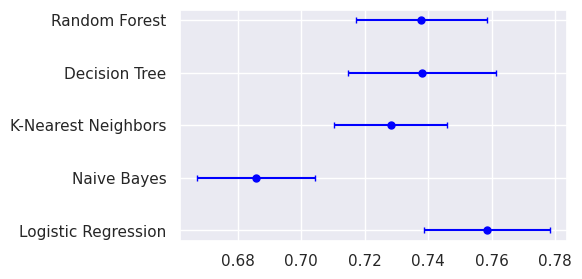

In [40]:
plt.figure(figsize=(5, 3))
for model in (eval_model.columns):
  plt.errorbar(y=model, x=eval_model[model].mean(),
                 xerr=eval_model[model].std(), color='blue',
                  marker= '.',markersize=10, fmt='_', capsize=2)

After randomization of 5 different train-test splits and 5-fold cross validation over subsets of the test sets, among the models we have trained, Logistic Regression seems to be the best performing model, with an f-1 score just below 0.76.

Let's see if we can improve this model by tuning its hyperparameters

## Grid Search and Hyperparameter Optimization

In [41]:
X_train, X_test,Y_train, Y_test = train_test_split(df[features_list], df[target], test_size= 0.25, random_state = 123)
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

param_grid = [{
    'penalty': ['l2'],
    'C': [0.1, 1, 10, 100],
    'solver': ['lbfgs', 'saga']},
     {'penalty': ['l1','l2'],
    'C': [0.1, 1, 10, 100],
    'solver': ['liblinear']}]

model = GridSearchCV(LogisticRegression(max_iter = 8000), param_grid, cv=5, scoring = 'f1')
model.fit(X_train, Y_train)
model.best_estimator_

LogisticRegression(C=10, max_iter=8000)

In [42]:
model.best_params_

{'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}

In [43]:
Ptrain = model.predict(X_train)
Ptest = model.predict(X_test)

print("train accuracy:", accuracy_score(Y_train, Ptrain))
print("test accuracy:", accuracy_score(Y_test, Ptest))

print("train F1:", f1_score(Y_train, Ptrain))
print("test F1:", f1_score(Y_test, Ptest))

train accuracy: 0.9862532972876734
test accuracy: 0.9862112586970272
train F1: 0.7625829422236609
test F1: 0.7668172094128832


In [44]:
cm_train = confusion_matrix(Y_train, Ptrain, normalize='true')
cm_test = confusion_matrix(Y_test, Ptest, normalize='true')

def plot_cm(ax, cm, title):
    classes = [0, 1]
    df_cm = pd.DataFrame(cm, index=classes, columns=classes)
    sns.heatmap(df_cm, annot=True, fmt='g', ax = ax)
    ax.set_xlabel("Predicted")
    ax.set_ylabel("Target")
    ax.set_title(title)


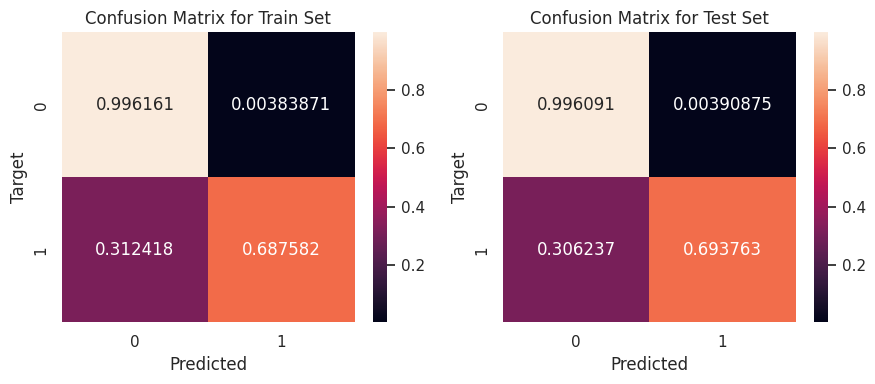

In [45]:
fig, axes = plt.subplots(1, 2, figsize=(9, 4))
plot_cm(axes[0], cm_train, title='Confusion Matrix for Train Set')
plot_cm(axes[1], cm_test, title='Confusion Matrix for Test Set')

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Feature Importance')

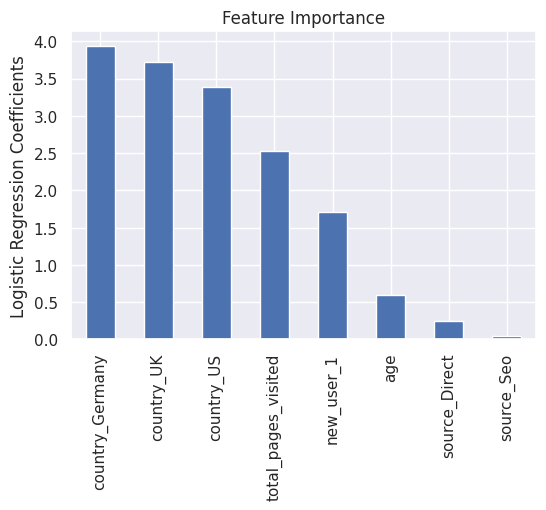

In [46]:
# Finally, let's look at the feature importance

importance = pd.Series(np.abs(model.best_estimator_.coef_[0]))
importance.index = column_names
importance.sort_values(inplace=True, ascending=False)
importance.plot.bar(figsize=(6,4))
plt.ylabel('Logistic Regression Coefficients')
plt.title('Feature Importance')

In [78]:
X_train, Y_train = df[features_list], df[target]
X_train = preprocessor.fit_transform(X_train)

Final_Model = LogisticRegression(C=10, penalty = 'l2', solver = 'lbfgs')
Final_Model.fit(X_train, Y_train)

LogisticRegression(C=10)

In [79]:
P_train = Final_Model.predict(X_train)
print("train F1:", f1_score(Y_train, P_train))

train F1: 0.7638972627517182


In [80]:
df_test = pd.read_csv("conversion_data_test.csv")
X_test = df_test[features_list]

X_test = preprocessor.transform(X_test)

P_test = Final_Model.predict(X_test)

In [87]:
print("Percentage of users predicted to convert in test set: %",
 round((np.count_nonzero(P_test == 1) / len(P_test)),3) * 100)

Percentage of users predicted to convert in test set: % 2.6


In [88]:
predictions = pd.DataFrame(columns=['converted'],data=P_test)
predictions.to_csv('conversion_rate_challenge_preds.csv', index=False)